### Imports and file Discovery

In [1]:
import glob
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt

In [2]:
DATA_DIR = "data"
tif_files = sorted(glob.glob(os.path.join(DATA_DIR, "*.tif")))
tif_files

['data/01_12_2018.tif',
 'data/01_12_2019.tif',
 'data/01_12_2020.tif',
 'data/01_12_2021.tif',
 'data/01_12_2022.tif',
 'data/01_12_2023.tif',
 'data/01_12_2024.tif',
 'data/01_12_2025.tif']

### Helper Function

In [3]:
def read_bands(path):
    """
    Assumes band order:
    1: R, 2: G, 3: B, 4: NIR, 5: SWIR
    """
    with rasterio.open(path) as src:
        arr = src.read().astype(np.float32)
    return arr


def safe_div(numer, denom):
    return np.where(denom == 0, np.nan, numer / denom)


def stretch(img, pmin=2, pmax=98):
    """Percentile stretch for high contrast visualization"""
    lo, hi = np.nanpercentile(img, (pmin, pmax))
    return np.clip((img - lo) / (hi - lo), 0, 1)

### Index Computation

In [4]:
def compute_indices(arr):
    R, G, B, NIR, SWIR = arr

    ndvi  = safe_div(NIR - R, NIR + R)
    mndwi = safe_div(G - SWIR, G + SWIR)
    ndbi  = safe_div(SWIR - NIR, SWIR + NIR)

    return ndvi, mndwi, ndbi

### Visualization for all tiffs

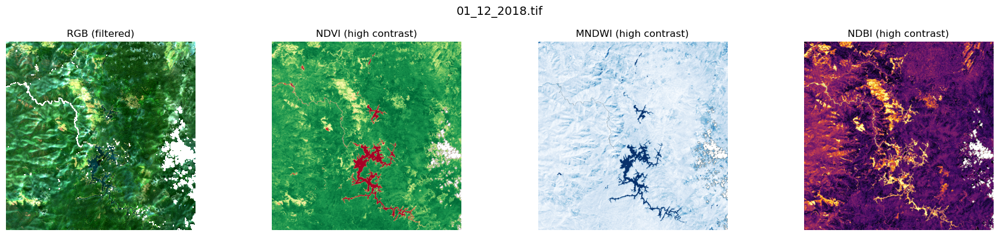

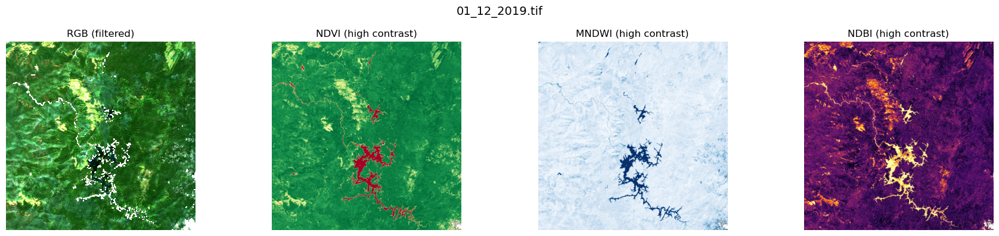

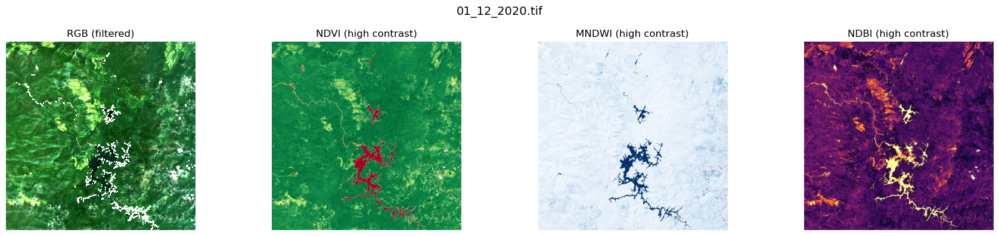

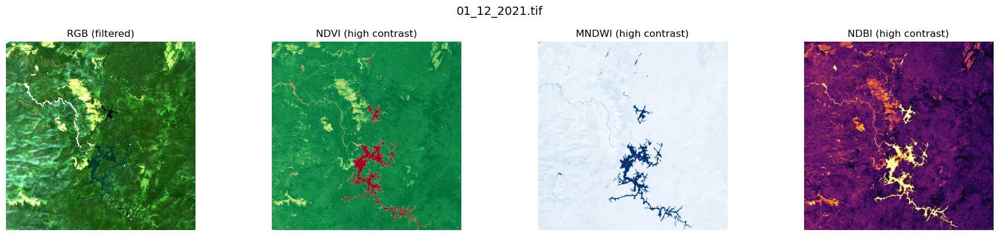

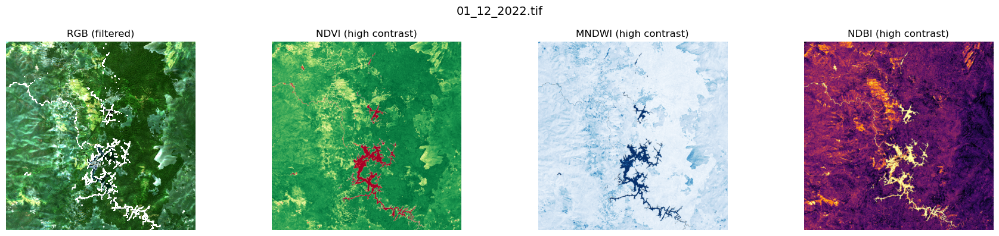

/tmp/ipykernel_52341/2913763384.py:12: RuntimeWarning: invalid value encountered in divide
  return np.where(denom == 0, np.nan, numer / denom)


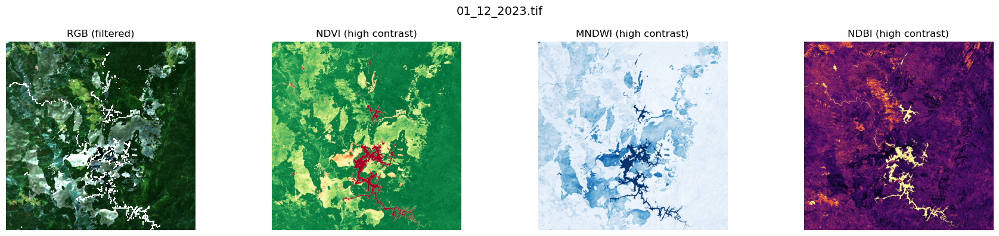

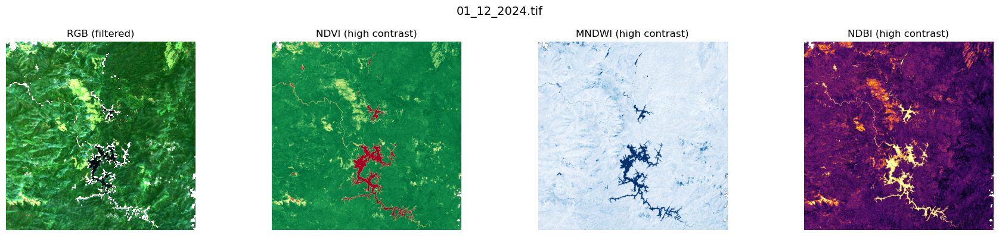

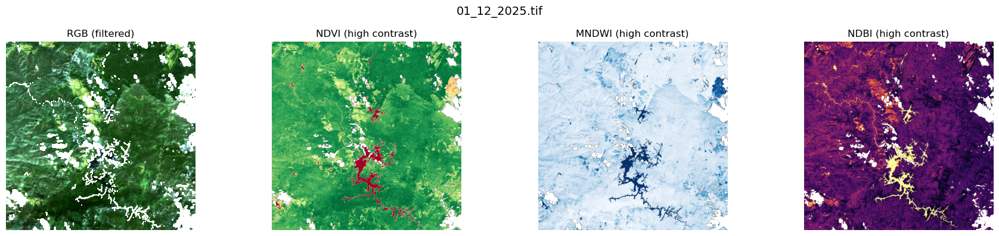

In [5]:
for path in tif_files:
    name = os.path.basename(path)

    arr = read_bands(path)
    ndvi, mndwi, ndbi = compute_indices(arr)

    # RGB composite
    rgb = np.stack([arr[0], arr[1], arr[2]], axis=-1)
    rgb_vis = stretch(rgb)

    fig, axes = plt.subplots(1, 4, figsize=(18, 4))
    fig.suptitle(name, fontsize=14)

    axes[0].imshow(rgb_vis)
    axes[0].set_title("RGB (filtered)")
    axes[0].axis("off")

    axes[1].imshow(stretch(ndvi), cmap="RdYlGn")
    axes[1].set_title("NDVI (high contrast)")
    axes[1].axis("off")

    axes[2].imshow(stretch(mndwi), cmap="Blues")
    axes[2].set_title("MNDWI (high contrast)")
    axes[2].axis("off")

    axes[3].imshow(stretch(ndbi), cmap="inferno")
    axes[3].set_title("NDBI (high contrast)")
    axes[3].axis("off")

    plt.tight_layout()
    plt.show()

### Quick Band Sanity Check

In [6]:
for path in tif_files:
    with rasterio.open(path) as src:
        print(os.path.basename(path), "→ bands:", src.count)

01_12_2018.tif → bands: 5
01_12_2019.tif → bands: 5
01_12_2020.tif → bands: 5
01_12_2021.tif → bands: 5
01_12_2022.tif → bands: 5
01_12_2023.tif → bands: 5
01_12_2024.tif → bands: 5
01_12_2025.tif → bands: 5


### Time Series Construction

In [7]:
# %%
import pandas as pd

In [8]:
# %%
def extract_year(fname):
    """
    Filename format: DD_MM_YYYY.tif
    Example: 01_12_2018.tif → 2018
    """
    return int(os.path.splitext(fname)[0].split("_")[-1])

In [9]:
# %%
records = []

for path in tif_files:
    fname = os.path.basename(path)
    year = extract_year(fname)

    arr = read_bands(path)
    ndvi, mndwi, ndbi = compute_indices(arr)

    records.append({
        "year": year,
        "ndvi_mean":  np.nanmean(ndvi),
        "mndwi_mean": np.nanmean(mndwi),
        "ndbi_mean":  np.nanmean(ndbi),
    })

df = (
    pd.DataFrame(records)
    .sort_values("year")
    .reset_index(drop=True)
)

df

/tmp/ipykernel_52341/2913763384.py:12: RuntimeWarning: invalid value encountered in divide
  return np.where(denom == 0, np.nan, numer / denom)


,year,ndvi_mean,mndwi_mean,ndbi_mean
0,2018,0.761122,-0.487546,-0.256126
1,2019,0.796702,-0.544169,-0.251382
2,2020,0.801656,-0.539256,-0.250086
3,2021,0.802064,-0.571617,-0.238583
4,2022,0.786952,-0.549410,-0.234270
5,2023,0.777577,-0.523749,-0.252881
6,2024,0.820332,-0.575072,-0.254679
7,2025,0.793792,-0.556468,-0.249416


### Year to Year Rate of Change

In [10]:
# %%
rate_df = df.copy()

rate_df["period"] = (
    rate_df["year"].astype(str)
    + "–"
    + rate_df["year"].shift(-1).astype("Int64").astype(str)
)

rate_df["ndvi_rate"]  = rate_df["ndvi_mean"].diff()
rate_df["mndwi_rate"] = rate_df["mndwi_mean"].diff()
rate_df["ndbi_rate"]  = rate_df["ndbi_mean"].diff()

# Drop first (diff undefined) and last (no forward year)
rate_df = rate_df.iloc[1:].reset_index(drop=True)

rate_df = rate_df[[
    "period",
    "ndvi_rate",
    "mndwi_rate",
    "ndbi_rate"
]]

rate_df

,period,ndvi_rate,mndwi_rate,ndbi_rate
0,2019–2020,0.035580,-0.056623,0.004744
1,2020–2021,0.004954,0.004913,0.001296
2,2021–2022,0.000408,-0.032361,0.011503
3,2022–2023,-0.015111,0.022207,0.004313
4,2023–2024,-0.009375,0.025661,-0.018612
5,2024–2025,0.042755,-0.051324,-0.001798
6,2025–<NA>,-0.026540,0.018605,0.005263


### Temporal Evolution of Indices

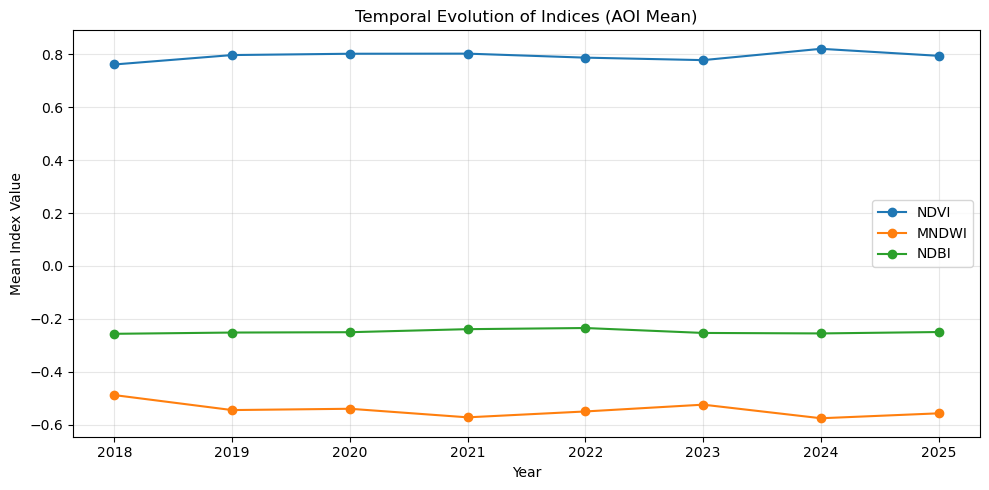

In [11]:
# %%
plt.figure(figsize=(10, 5))

plt.plot(df["year"], df["ndvi_mean"],  marker="o", label="NDVI")
plt.plot(df["year"], df["mndwi_mean"], marker="o", label="MNDWI")
plt.plot(df["year"], df["ndbi_mean"],  marker="o", label="NDBI")

plt.xlabel("Year")
plt.ylabel("Mean Index Value")
plt.title("Temporal Evolution of Indices (AOI Mean)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

### Year to Year rate of change visualization

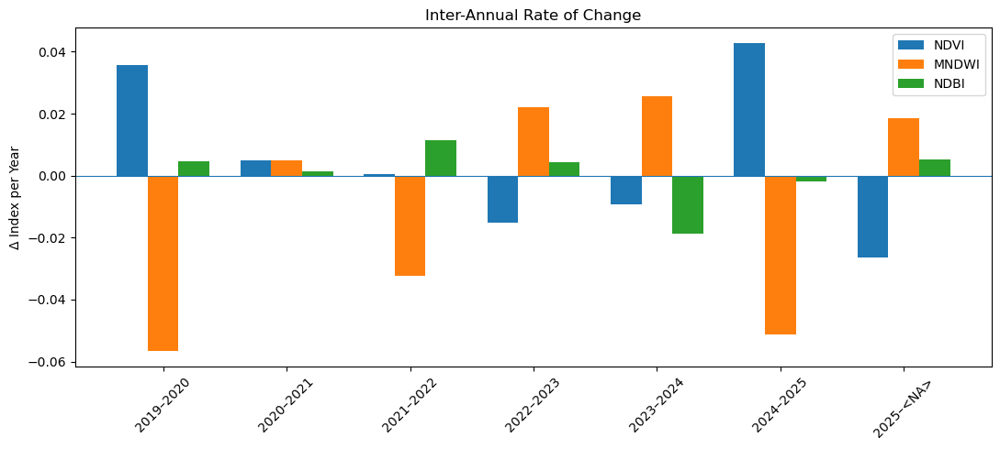

In [12]:
# %%
x = np.arange(len(rate_df))
w = 0.25

plt.figure(figsize=(11, 5))

plt.bar(x - w, rate_df["ndvi_rate"],  w, label="NDVI")
plt.bar(x,     rate_df["mndwi_rate"], w, label="MNDWI")
plt.bar(x + w, rate_df["ndbi_rate"],  w, label="NDBI")

plt.xticks(x, rate_df["period"], rotation=45)
plt.ylabel("Δ Index per Year")
plt.title("Inter-Annual Rate of Change")
plt.axhline(0, linewidth=0.8)
plt.legend()
plt.tight_layout()
plt.show()

## Deforestation Detection

### Stack NDVI Time Series

In [13]:
# %%
years = []
ndvi_stack = []

for path in tif_files:
    fname = os.path.basename(path)
    year = extract_year(fname)

    arr = read_bands(path)
    ndvi, _, _ = compute_indices(arr)

    years.append(year)
    ndvi_stack.append(ndvi)

years = np.array(years)
ndvi_stack = np.stack(ndvi_stack, axis=0)  # shape: (T, H, W)

years, ndvi_stack.shape

/tmp/ipykernel_52341/2913763384.py:12: RuntimeWarning: invalid value encountered in divide
  return np.where(denom == 0, np.nan, numer / denom)


(array([2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025]), (8, 1252, 1253))

### Pixel wise NDVI linear Trend (slope)

In [14]:
# %%
from numpy.polynomial.polynomial import polyfit

In [15]:
# %%
def compute_pixelwise_slope(time, stack):
    """
    Computes linear slope per pixel.
    """
    T, H, W = stack.shape
    slope = np.full((H, W), np.nan, dtype=np.float32)

    for i in range(H):
        for j in range(W):
            y = stack[:, i, j]
            if np.count_nonzero(~np.isnan(y)) >= 3:
                b, m = polyfit(time, y, 1)  # y = m*x + b
                slope[i, j] = m

    return slope

In [22]:
# %%
ndvi_slope = compute_pixelwise_slope(years, ndvi_stack)

### NDVI Net change (First year vs last year)

In [17]:
# %%
ndvi_delta = ndvi_stack[-1] - ndvi_stack[0]

### Define Deforestation Hotspot

In [18]:
# %%
SLOPE_THRESHOLD = -0.02
DELTA_THRESHOLD = -0.20

hotspots = (
    (ndvi_slope < SLOPE_THRESHOLD) &
    (ndvi_delta < DELTA_THRESHOLD)
)

### Visualize Hotspot

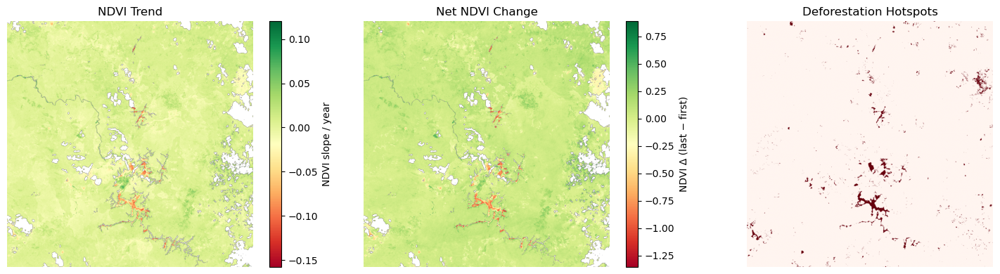

In [19]:
# %%
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.imshow(ndvi_slope, cmap="RdYlGn")
plt.colorbar(label="NDVI slope / year")
plt.title("NDVI Trend")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(ndvi_delta, cmap="RdYlGn")
plt.colorbar(label="NDVI Δ (last − first)")
plt.title("Net NDVI Change")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(hotspots, cmap="Reds")
plt.title("Deforestation Hotspots")
plt.axis("off")

plt.tight_layout()
plt.show()

### Quantify Hotspot Area

In [20]:
# %%
pixel_area_ha = (20 * 20) / 10_000  # 20 m Sentinel pixels

hotspot_area_ha = np.sum(hotspots) * pixel_area_ha

hotspot_area_ha

895.96

### Overlay Hotspots on latest RGB

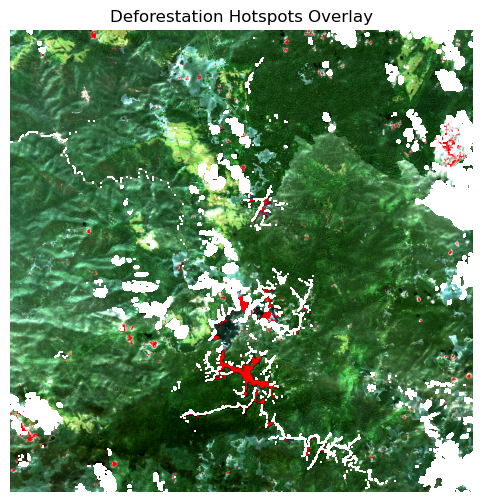

In [21]:
# %%
latest_rgb = read_bands(tif_files[-1])[:3]
latest_rgb_vis = stretch(np.stack(latest_rgb, axis=-1))

overlay = latest_rgb_vis.copy()
overlay[hotspots] = [1, 0, 0]  # red overlay

plt.figure(figsize=(6, 6))
plt.imshow(overlay)
plt.title("Deforestation Hotspots Overlay")
plt.axis("off")
plt.show()